In [51]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np
import xarray as xr
import dateparser
import calendar
from itertools import chain

from skyfield.api import load

from rich import print


In [ ]:
def flatten(list_of_lists):
    if len(list_of_lists) == 0:
        return list_of_lists
    if isinstance(list_of_lists[0], list):
        return flatten(list_of_lists[0]) + flatten(list_of_lists[1:])
    return list_of_lists[:1] + flatten(list_of_lists[1:])

In [75]:
def flatten(obj):
    l = []
    if isinstance(obj, str):
        return obj
    try:
        for item in obj:
            l
            
    


SyntaxError: incomplete input (4009476792.py, line 3)

In [74]:
l = [1,2,3,[4,[6,7]]]
flatten(l)

IndexError: list index out of range

In [39]:
ts = load.timescale()
kernel = load('de421.bsp')

In [60]:
cal = calendar.Calendar(firstweekday=6)
year = cal.yeardatescalendar(2023)

In [3]:
first_of_months = [dateparser.parse(f"2023/{m}/01")
dec31dt = dateparser.parse("December 31, 2023 23:59 ET")

In [4]:
jan1sf = ts.from_datetime(jan1dt)
dec31sf = ts.from_datetime(dec31dt)

In [5]:
dec31sf.ut1_calendar()

(2024, 1, 1, 4, 59, 0.050322358601988526)

In [6]:
(dec31sf-jan1sf)

364.99930555555557

In [7]:
type((dec31sf-jan1sf))

numpy.float64

In [8]:
days = ts.linspace(jan1sf, dec31sf, int((dec31sf-jan1sf) * 365))

In [9]:
days

<Time tt=[2459945.709134074 ... 2460310.7084396295] len=133224>

In [10]:
earth_path = (kernel["Earth"] - kernel["Sun"]).at(days)

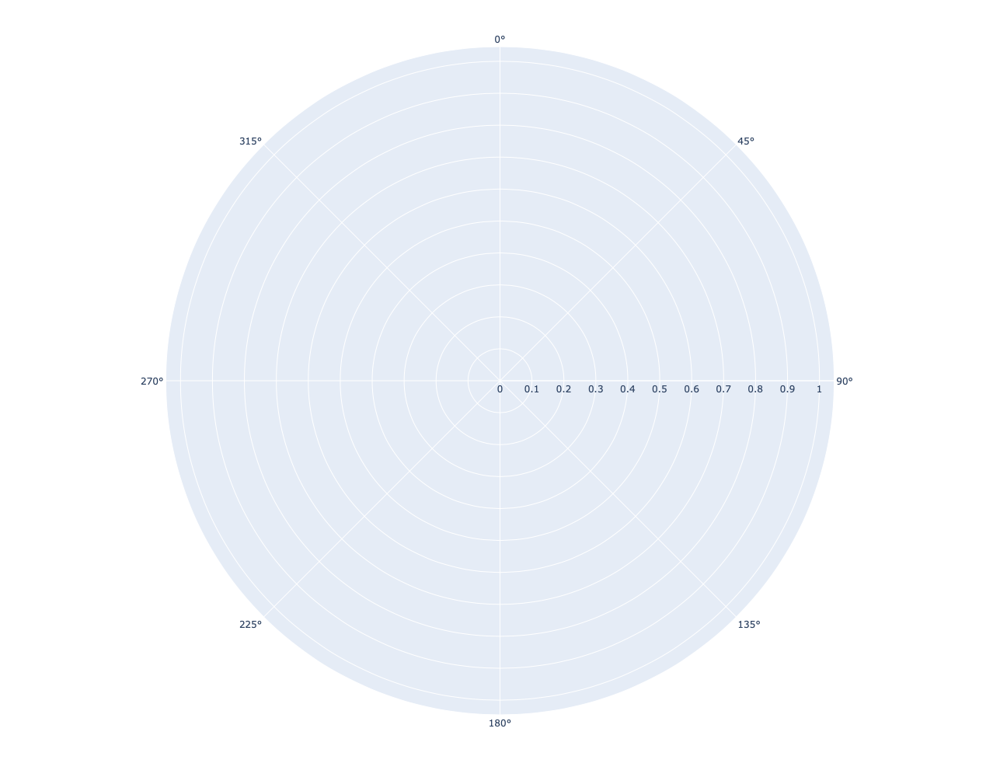

In [12]:
fig = px.scatter_polar(theta=earth_path.ecliptic_latlon()[1].degrees, r=earth_path.ecliptic_latlon()[2].au, height=1000)
fig.show()